# RSICD Image Captioning — EfficientNet-B3 + Attention LSTM

## Architecture
```
Remote Sensing Image → EfficientNet-B3 (Encoder) → 49 × 1536 Feature Map
                     → Bahdanau Attention + LSTM (Decoder) → Caption
```

### Key facts about the RSICD dataset
- ~10,921 remote sensing images (224×224 px) from Google Earth, Baidu Map, etc.
- **5 captions per image** — we use all 5 during training (data augmentation)
- Images are stored as raw **bytes inside the CSV** — no separate image folder needed
- Columns: `filename`, `captions` (string list), `image` (dict with 'bytes' key)

## Step 1 — Install & Imports

In [1]:
!pip install -q timm
!pip install -q gradio
!pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.6/68.6 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 444.8/444.8 kB 12.3 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 47.3 MB/s eta 0:00:0000:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-adk 1.22.1 requires google-cloud-bigquery-storage>=2.0.0, which is not installed.
langchain-core 0.3.79 requires packaging<26.0.0,>=23.2.0, but you have packaging 26.0rc2 which is incompatible.
fastai 2.8.4 requires fastcore<1.9,>=1.8.0, but you have fastcore 1.11.3 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 4.4 MB/s eta 0:00:00


In [2]:
import os, gc, io, json, math, ast, re, random, shutil, time, warnings
from collections import Counter
from tqdm import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go

from PIL import Image
import cv2

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

import timm

warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device : {device}')
if torch.cuda.is_available():
    print(f'GPU    : {torch.cuda.get_device_name(0)}')
    print(f'Memory : {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB')

Device : cuda
GPU    : Tesla T4
Memory : 15.6 GB


## Step 2 — Configuration

In [3]:
class Config:
    # ── Kaggle dataset paths ─────────────────────────────────────────────
    BASE_DIR   = '/kaggle/input/rsicd-image-caption-dataset'
    TRAIN_CSV  = f'{BASE_DIR}/train.csv'
    VAL_CSV    = f'{BASE_DIR}/valid.csv'
    TEST_CSV   = f'{BASE_DIR}/test.csv'
    SAVE_DIR   = '/kaggle/working/saved_model'

    # ── Dataset ──────────────────────────────────────────────────────────
    # RSICD has 5 captions per image — we expand to one row per caption
    MAX_TRAIN       = 6000     # rows after expansion (keep training feasible)
    MAX_VAL         = 1000
    MAX_TEST        = 500
    MIN_WORD_FREQ   = 2
    MAX_CAPTION_LEN = 40

    # ── Image ─────────────────────────────────────────────────────────────
    IMG_SIZE = 224             # EfficientNet-B3 native size

    # ── Encoder ──────────────────────────────────────────────────────────
    ENCODER_MODEL   = 'efficientnet_b3'
    ENCODER_DIM     = 1536             # conv_head output channels
    ATTENTION_DIM   = 512
    ENCODER_DROPOUT = 0.3
    ENC_SPATIAL     = 7                # 7×7 = 49 attention positions

    # ── Decoder ───────────────────────────────────────────────────────────
    EMBED_DIM       = 256
    HIDDEN_DIM      = 512
    DECODER_DROPOUT = 0.5

    # ── Training ──────────────────────────────────────────────────────────
    EPOCHS            = 20
    BATCH_SIZE        = 32
    LR                = 4e-4
    ENCODER_LR        = 1e-4
    WEIGHT_DECAY      = 1e-4
    GRAD_CLIP         = 5.0
    FINE_TUNE_ENCODER = True
    FINE_TUNE_EPOCH   = 3
    LABEL_SMOOTHING   = 0.1
    BEAM_SIZE         = 5

    # ── Special tokens ────────────────────────────────────────────────────
    PAD = '<PAD>'; SOS = '<SOS>'; EOS = '<EOS>'; UNK = '<UNK>'

cfg = Config()
os.makedirs(cfg.SAVE_DIR, exist_ok=True)
print('Config ready.')

Config ready.


## Step 3 — Load & Parse the Dataset

### Important: Image storage format
In this dataset the images are **NOT** separate files.
Each row's `image` column holds a Python dict string:
```python
"{'bytes': b'\xff\xd8...'}"
```
We decode it with `ast.literal_eval` → extract bytes → open with PIL.

The `captions` column is also a Python list string with 5 entries per image.
We **expand** to one row per caption so every caption is a separate training sample.

In [4]:
def parse_captions(raw: str) -> list:
    """
    Convert the raw captions string (a Python list of 5 strings) into a
    clean Python list of caption strings.
    """
    # Remove outer brackets & split on newlines
    raw = raw.strip()
    try:
        # Try ast parse first (most reliable)
        parsed = ast.literal_eval(raw)
        if isinstance(parsed, list):
            return [str(c).strip().strip("'\"") for c in parsed]
    except Exception:
        pass
    # Fallback: split on newline, strip quotes/brackets
    parts = raw.replace('[','').replace(']','').split('\n')
    return [p.strip().strip("'\"").strip(',') for p in parts if p.strip()]


def bytes_to_pil(byte_str: str) -> Image.Image:
    """Convert the 'image' column string → PIL Image."""
    data = ast.literal_eval(byte_str)          # dict with 'bytes' key
    return Image.open(io.BytesIO(data['bytes'])).convert('RGB')


def load_split(csv_path: str, max_rows: int = None) -> pd.DataFrame:
    """
    Load one CSV split, expand to one row per caption, return DataFrame with:
        filename | caption | image_bytes_str
    """
    df = pd.read_csv(csv_path)
    print(f'{os.path.basename(csv_path)}: {len(df)} images')

    rows = []
    for _, row in df.iterrows():
        caps = parse_captions(str(row['captions']))
        for cap in caps:
            if cap:   # skip empty strings
                rows.append({
                    'filename'        : row['filename'],
                    'caption'         : cap.lower().strip(),
                    'image_bytes_str' : str(row['image']),
                })

    expanded = pd.DataFrame(rows).reset_index(drop=True)
    print(f'  → {len(expanded)} caption rows after expansion (5 per image)')

    if max_rows and len(expanded) > max_rows:
        expanded = expanded.sample(max_rows, random_state=SEED).reset_index(drop=True)
        print(f'  → sampled to {len(expanded)} rows')
    return expanded


df_train = load_split(cfg.TRAIN_CSV, cfg.MAX_TRAIN)
df_val   = load_split(cfg.VAL_CSV,   cfg.MAX_VAL)
df_test  = load_split(cfg.TEST_CSV,  cfg.MAX_TEST)

print(f'\nFinal — Train: {len(df_train)} | Val: {len(df_val)} | Test: {len(df_test)}')
df_train.head(3)

train.csv: 8734 images
  → 8734 caption rows after expansion (5 per image)
  → sampled to 6000 rows
valid.csv: 1094 images
  → 1094 caption rows after expansion (5 per image)
  → sampled to 1000 rows
test.csv: 1093 images
  → 1093 caption rows after expansion (5 per image)
  → sampled to 500 rows

Final — Train: 6000 | Val: 1000 | Test: 500


,filename,caption,image_bytes_str
0,rsicd_images/industrial_105.jpg,many buildings and some green trees are locate...,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...
1,rsicd_images/commercial_14.jpg,many buildings are located in a commercial are...,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...
2,rsicd_images/bridge_329.jpg,there's a strong bridge over the river.there a...,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...


## Step 4 — Exploratory Data Analysis

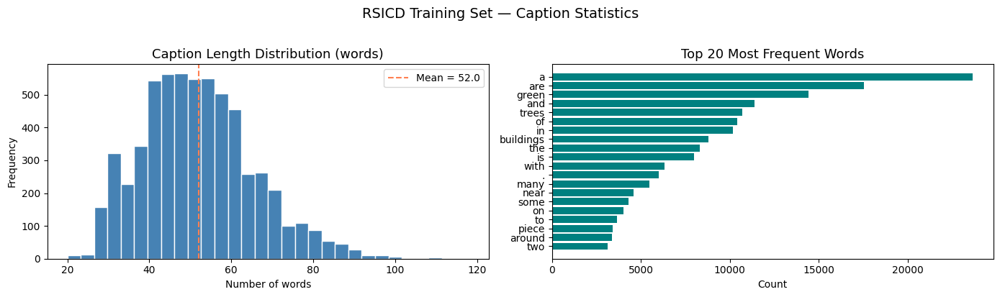

Caption length  — mean: 52.0  | max: 118  | min: 20


In [5]:
# ── Caption length distribution ──────────────────────────────────────────
df_train['cap_len'] = df_train['caption'].str.split().apply(len)

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

axes[0].hist(df_train['cap_len'], bins=30, color='steelblue', edgecolor='white')
axes[0].set_title('Caption Length Distribution (words)', fontsize=13)
axes[0].set_xlabel('Number of words')
axes[0].set_ylabel('Frequency')
axes[0].axvline(df_train['cap_len'].mean(), color='coral', ls='--',
                label=f'Mean = {df_train["cap_len"].mean():.1f}')
axes[0].legend()

# Top 20 most frequent words
all_words = ' '.join(df_train['caption']).split()
word_freq = Counter(all_words).most_common(20)
words, counts = zip(*word_freq)
axes[1].barh(words[::-1], counts[::-1], color='teal')
axes[1].set_title('Top 20 Most Frequent Words', fontsize=13)
axes[1].set_xlabel('Count')

plt.suptitle('RSICD Training Set — Caption Statistics', fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(f'{cfg.SAVE_DIR}/eda_caption_stats.png', dpi=150, bbox_inches='tight')
plt.show()

print(f'Caption length  — mean: {df_train["cap_len"].mean():.1f}  '
      f'| max: {df_train["cap_len"].max()}  '
      f'| min: {df_train["cap_len"].min()}')

In [6]:
# ── Scene category distribution (derived from filename prefix) ────────────
df_train['category'] = df_train['filename'].str.replace('rsicd_images/', '', regex=False)\
                                           .str.extract(r'^([a-zA-Z_]+?)_\d+')[0]

top_cats = df_train['category'].value_counts().head(15)

fig = px.bar(
    x=top_cats.values, y=top_cats.index,
    orientation='h',
    color=top_cats.values,
    color_continuous_scale='Teal',
    labels={'x': 'Number of Captions', 'y': 'Scene Category'},
    title='Top 15 Scene Categories in Training Set'
)
fig.update_layout(height=450, coloraxis_showscale=False)
fig.show()

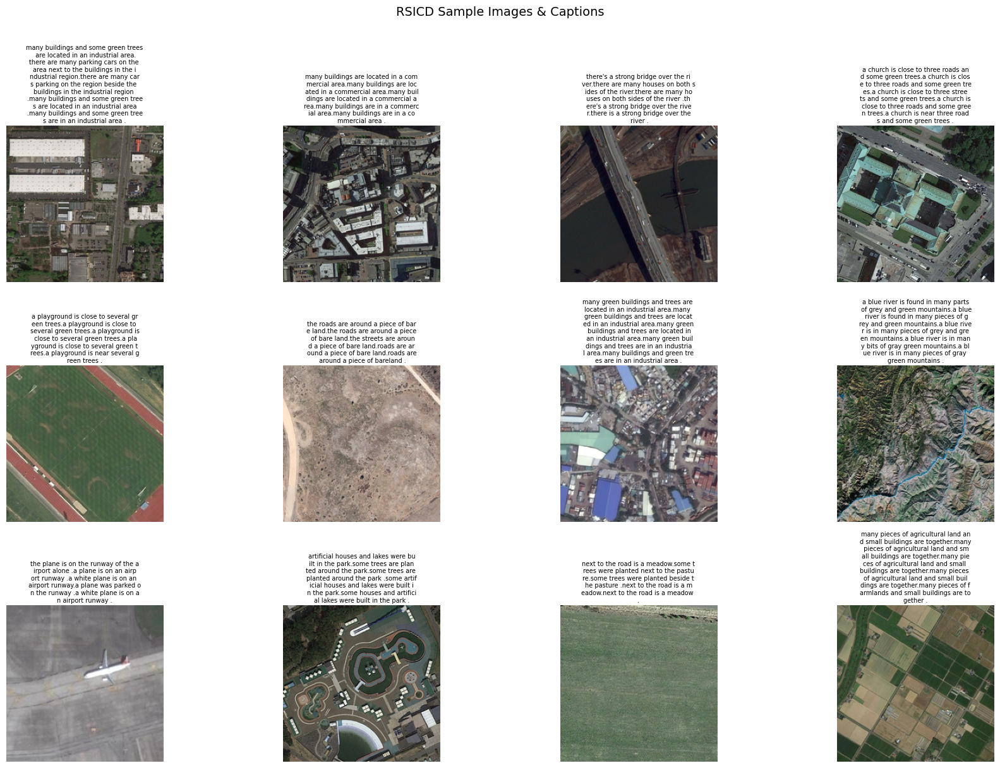

In [7]:
# ── Show 12 sample images with their first caption ───────────────────────
samples = df_train.drop_duplicates('filename').head(12)

fig, axes = plt.subplots(3, 4, figsize=(18, 12))
axes = axes.flatten()

for ax, (_, row) in zip(axes, samples.iterrows()):
    try:
        img = bytes_to_pil(row['image_bytes_str'])
        ax.imshow(img)
        # Wrap caption text at 35 chars
        cap = row['caption']
        wrapped = '\n'.join([cap[i:i+35] for i in range(0, len(cap), 35)])
        ax.set_title(wrapped, fontsize=7, pad=3)
    except Exception as e:
        ax.set_title(f'Error: {e}', fontsize=7)
    ax.axis('off')

plt.suptitle('RSICD Sample Images & Captions', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig(f'{cfg.SAVE_DIR}/eda_sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

In [8]:
# ── Split size comparison ─────────────────────────────────────────────────
split_sizes = {'Train': len(df_train), 'Validation': len(df_val), 'Test': len(df_test)}
fig = px.pie(
    names=list(split_sizes.keys()),
    values=list(split_sizes.values()),
    title='Dataset Split Distribution',
    color_discrete_sequence=px.colors.qualitative.Pastel,
    hole=0.35
)
fig.show()

## Step 5 — Vocabulary

In [9]:
class Vocabulary:
    def __init__(self, min_freq=cfg.MIN_WORD_FREQ):
        self.min_freq = min_freq
        self.word2idx = {}
        self.idx2word = {}
        self.freq     = Counter()
        for tok in [cfg.PAD, cfg.SOS, cfg.EOS, cfg.UNK]:
            self._add(tok)

    def _add(self, word):
        if word not in self.word2idx:
            idx = len(self.word2idx)
            self.word2idx[word] = idx
            self.idx2word[idx]  = word

    def build(self, captions):
        for cap in captions:
            for w in cap.lower().split():
                self.freq[w] += 1
        for word, cnt in self.freq.items():
            if cnt >= self.min_freq:
                self._add(word)
        print(f'Vocabulary size: {len(self):,} tokens (min_freq={self.min_freq})')

    def encode(self, caption, max_len=cfg.MAX_CAPTION_LEN):
        tokens = [cfg.SOS] + caption.lower().split() + [cfg.EOS]
        ids    = [self.word2idx.get(t, self.word2idx[cfg.UNK]) for t in tokens]
        ids    = ids[:max_len + 2]
        ids   += [self.word2idx[cfg.PAD]] * (max_len + 2 - len(ids))
        return ids

    def decode(self, ids, skip_special=True):
        special = {cfg.PAD, cfg.SOS, cfg.EOS}
        words   = []
        for i in ids:
            w = self.idx2word.get(i, cfg.UNK)
            if w == cfg.EOS:  break
            if skip_special and w in special:  continue
            words.append(w)
        return ' '.join(words)

    def __len__(self):
        return len(self.word2idx)


vocab = Vocabulary()
vocab.build(df_train['caption'].tolist())

# Save
with open(f'{cfg.SAVE_DIR}/vocab.json', 'w') as f:
    json.dump({'word2idx': vocab.word2idx,
               'idx2word': {str(k): v for k, v in vocab.idx2word.items()}}, f)
print('Vocabulary saved.')

Vocabulary size: 2,612 tokens (min_freq=2)
Vocabulary saved.


## Step 6 — Dataset & DataLoader

Because images live in the CSV as byte strings, the `__getitem__` decodes them on the fly with `ast.literal_eval` + PIL — no file paths needed.

In [10]:
def get_transforms(split='train'):
    mean = [0.485, 0.456, 0.406]
    std  = [0.229, 0.224, 0.225]
    if split == 'train':
        return transforms.Compose([
            transforms.Resize((cfg.IMG_SIZE + 32, cfg.IMG_SIZE + 32)),
            transforms.RandomCrop(cfg.IMG_SIZE),
            transforms.RandomHorizontalFlip(0.5),
            transforms.RandomVerticalFlip(0.2),       # useful for satellite imagery
            transforms.RandomRotation(degrees=15),
            transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2),
            transforms.ToTensor(),
            transforms.Normalize(mean, std),
        ])
    return transforms.Compose([
        transforms.Resize((cfg.IMG_SIZE, cfg.IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(mean, std),
    ])


class RSICDDataset(Dataset):
    def __init__(self, df, vocab, split='train'):
        self.df        = df.reset_index(drop=True)
        self.vocab     = vocab
        self.transform = get_transforms(split)
        self._black    = transforms.ToTensor()(
                             Image.new('RGB', (cfg.IMG_SIZE, cfg.IMG_SIZE), (0,0,0))
                         )  # fallback for corrupt images — all-zero tensor

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        # ── Decode image from bytes stored in CSV (with error fallback) ───
        try:
            img = bytes_to_pil(row['image_bytes_str'])
            img = self.transform(img)
        except Exception:
            # Return a black image — the NaN guard in train/val will skip it
            mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
            std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
            img  = (self._black - mean) / std   # normalised black image

        # ── Encode caption ────────────────────────────────────────────────
        cap_ids = self.vocab.encode(row['caption'])
        cap_ids = torch.tensor(cap_ids, dtype=torch.long)
        cap_len = (cap_ids != self.vocab.word2idx[cfg.PAD]).sum().item()

        return img, cap_ids, torch.tensor(cap_len, dtype=torch.long)


train_ds = RSICDDataset(df_train, vocab, 'train')
val_ds   = RSICDDataset(df_val,   vocab, 'val')
test_ds  = RSICDDataset(df_test,  vocab, 'test')

train_loader = DataLoader(train_ds, batch_size=cfg.BATCH_SIZE, shuffle=True,
                          num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=cfg.BATCH_SIZE, shuffle=False,
                          num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=1, shuffle=False)

print(f'Train batches: {len(train_loader)} | Val batches: {len(val_loader)}')

Train batches: 188 | Val batches: 32


## Step 7 — Model: EfficientNet-B3 Encoder + Bahdanau Attention + LSTM Decoder

In [11]:
# ── 7.1  EfficientNet-B3 Encoder ─────────────────────────────────────────
class EfficientNetEncoder(nn.Module):
    """
    Uses timm EfficientNet-B3 with global_pool='' and num_classes=0
    to preserve the spatial feature map (1536 ch) after conv_head.
    Output: (B, 49, 1536)  — 7×7 spatial grid, 1536 channels.
    """
    def __init__(self, encoded_image_size=cfg.ENC_SPATIAL,
                 dropout=cfg.ENCODER_DROPOUT):
        super().__init__()
        self.enc_image_size = encoded_image_size
        base = timm.create_model(
            cfg.ENCODER_MODEL, pretrained=True,
            num_classes=0, global_pool='',
        )
        assert hasattr(base, 'conv_head'), 'Model has no conv_head'
        self.efficientnet  = base
        self.adaptive_pool = nn.AdaptiveAvgPool2d((encoded_image_size, encoded_image_size))
        self.bn_after_pool = nn.BatchNorm2d(cfg.ENCODER_DIM)
        self.dropout       = nn.Dropout2d(dropout)
        self.fine_tune(False)

    def forward(self, x):
        f = self.efficientnet(x)          # (B, 1536, h, w)
        f = self.adaptive_pool(f)         # (B, 1536, 7, 7)
        f = self.bn_after_pool(f)
        f = self.dropout(f)
        B, C, H, W = f.shape
        return f.permute(0,2,3,1).view(B, H*W, C)   # (B, 49, 1536)

    def fine_tune(self, enable=True):
        for p in self.efficientnet.parameters():
            p.requires_grad = enable
        # Keep BN in eval mode even when encoder is frozen to avoid
        # running-stats update from small batches → prevents NaN in val
        if not enable:
            self.efficientnet.eval()
        print(f'Encoder fine-tuning: {enable}')


# ── 7.2  Bahdanau Attention ───────────────────────────────────────────────
class BahdanauAttention(nn.Module):
    def __init__(self):
        super().__init__()
        self.enc_att  = nn.Linear(cfg.ENCODER_DIM, cfg.ATTENTION_DIM)
        self.dec_att  = nn.Linear(cfg.HIDDEN_DIM,  cfg.ATTENTION_DIM)
        self.full_att = nn.Linear(cfg.ATTENTION_DIM, 1)
        self.relu     = nn.ReLU()
        self.softmax  = nn.Softmax(dim=1)

    def forward(self, enc_out, h):
        # enc_out: (B, P, enc_dim)  h: (B, hid_dim)
        e = self.full_att(self.relu(
                self.enc_att(enc_out) +
                self.dec_att(h).unsqueeze(1)
            )).squeeze(2)                              # (B, P)
        alpha   = self.softmax(e)                      # (B, P)
        context = (enc_out * alpha.unsqueeze(2)).sum(1) # (B, enc_dim)
        return context, alpha


# ── 7.3  LSTM Decoder ────────────────────────────────────────────────────
class LSTMDecoder(nn.Module):
    def __init__(self, vocab_size):
        super().__init__()
        self.vocab_size  = vocab_size
        self.attention   = BahdanauAttention()
        self.embedding   = nn.Embedding(vocab_size, cfg.EMBED_DIM, padding_idx=0)
        self.dropout     = nn.Dropout(cfg.DECODER_DROPOUT)
        self.lstm_cell   = nn.LSTMCell(
            input_size  = cfg.EMBED_DIM + cfg.ENCODER_DIM,
            hidden_size = cfg.HIDDEN_DIM,
        )
        self.init_h = nn.Linear(cfg.ENCODER_DIM, cfg.HIDDEN_DIM)
        self.init_c = nn.Linear(cfg.ENCODER_DIM, cfg.HIDDEN_DIM)
        self.fc_out = nn.Linear(cfg.HIDDEN_DIM, vocab_size)
        nn.init.xavier_uniform_(self.fc_out.weight)

    def init_hidden(self, enc_out):
        m = enc_out.mean(1)
        return torch.tanh(self.init_h(m)), torch.tanh(self.init_c(m))

    def forward(self, enc_out, captions, cap_lens):
        B, _, _  = enc_out.shape
        max_len  = captions.size(1) - 1
        embs     = self.embedding(captions)          # (B, L+1, E)
        h, c     = self.init_hidden(enc_out)
        preds    = torch.zeros(B, max_len, self.vocab_size, device=enc_out.device)
        alphas   = torch.zeros(B, max_len, enc_out.size(1), device=enc_out.device)
        for t in range(max_len):
            ctx, alpha = self.attention(enc_out, h)
            h, c = self.lstm_cell(
                self.dropout(torch.cat([embs[:, t, :], ctx], dim=1)), (h, c)
            )
            preds[:, t, :]  = self.fc_out(self.dropout(h))
            alphas[:, t, :] = alpha
        return preds, alphas

    @torch.no_grad()
    def generate(self, enc_out, vocab, max_len=cfg.MAX_CAPTION_LEN,
                 beam_size=cfg.BEAM_SIZE):
        return (self._greedy(enc_out, vocab, max_len) if beam_size == 1
                else self._beam(enc_out, vocab, max_len, beam_size))

    def _greedy(self, enc_out, vocab, max_len):
        h, c  = self.init_hidden(enc_out)
        word  = torch.tensor([vocab.word2idx[cfg.SOS]], device=enc_out.device)
        words = []
        for _ in range(max_len):
            emb      = self.embedding(word)
            ctx, _   = self.attention(enc_out, h)
            h, c     = self.lstm_cell(torch.cat([emb, ctx], 1), (h, c))
            word     = self.fc_out(h).argmax(1)
            wid      = word.item()
            if wid == vocab.word2idx[cfg.EOS]:  break
            words.append(wid)
        return vocab.decode(words)

    def _beam(self, enc_out, vocab, max_len, k):
        h, c     = self.init_hidden(enc_out)
        enc      = enc_out.expand(k, -1, -1)
        sos, eos = vocab.word2idx[cfg.SOS], vocab.word2idx[cfg.EOS]
        beams    = [(0., [sos], h.expand(k,-1), c.expand(k,-1))]
        done     = []
        for _ in range(max_len):
            nb = []
            for sc, seq, bh, bc in beams:
                last  = torch.tensor([seq[-1]], device=enc_out.device).expand(k)
                embs  = self.embedding(last)
                ctx, _ = self.attention(enc, bh)
                nh, nc = self.lstm_cell(torch.cat([embs, ctx], 1), (bh, bc))
                lp     = F.log_softmax(self.fc_out(nh), 1)
                for p, idx in zip(*lp[0].topk(k)):
                    ns = sc + p.item()
                    if idx.item() == eos:  done.append((ns/len(seq), seq))
                    else:  nb.append((ns, seq+[idx.item()], nh, nc))
            beams = sorted(nb, key=lambda x: x[0]/len(x[1]), reverse=True)[:k]
            if not beams:  break
        best = max(done or [(0., beams[0][1])], key=lambda x: x[0])[1]
        return vocab.decode(best[1:])


# ── 7.4  Full model wrapper ───────────────────────────────────────────────
class RSICDCaptioner(nn.Module):
    def __init__(self, vocab_size):
        super().__init__()
        self.encoder = EfficientNetEncoder()
        self.decoder = LSTMDecoder(vocab_size)

    def forward(self, images, captions, cap_lens):
        return self.decoder(self.encoder(images), captions, cap_lens)

    def generate_caption(self, img_tensor, vocab, beam_size=cfg.BEAM_SIZE):
        enc = self.encoder(img_tensor.unsqueeze(0))
        return self.decoder.generate(enc, vocab, beam_size=beam_size)


# ── Sanity check ─────────────────────────────────────────────────────────
model = RSICDCaptioner(vocab_size=len(vocab)).to(device)
_x    = torch.randn(2, 3, cfg.IMG_SIZE, cfg.IMG_SIZE).to(device)
with torch.no_grad():
    _f = model.encoder(_x)
print(f'Encoder output: {_f.shape}')    # (2, 49, 1536)
assert _f.shape == (2, 49, cfg.ENCODER_DIM), f'Shape mismatch: {_f.shape}'
print('Shape assertion passed!')
del _x, _f; gc.collect()

total  = sum(p.numel() for p in model.parameters())
train_ = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Total params     : {total:,}')
print(f'Trainable params : {train_:,}  (encoder frozen)')

model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]

Encoder fine-tuning: False
Encoder output: torch.Size([2, 49, 1536])
Shape assertion passed!
Total params     : 20,054,621
Trainable params : 9,358,389  (encoder frozen)


## Step 8 — Loss, Optimizer & Scheduler

In [12]:
pad_idx   = vocab.word2idx[cfg.PAD]
criterion = nn.CrossEntropyLoss(ignore_index=pad_idx,
                                label_smoothing=cfg.LABEL_SMOOTHING)

optimizer = torch.optim.AdamW([
    {'params': model.decoder.parameters(),  'lr': cfg.LR},
    {'params': model.encoder.parameters(),  'lr': cfg.ENCODER_LR},
], weight_decay=cfg.WEIGHT_DECAY)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=cfg.EPOCHS, eta_min=1e-6
)

print('Loss / optimizer / scheduler ready.')

Loss / optimizer / scheduler ready.


## Step 9 — Training Loop

In [13]:
# ─────────────────────────────────────────────────────────────────────────────
# NaN Diagnostic — run ONCE before training to catch bad val rows early
# ─────────────────────────────────────────────────────────────────────────────
print('Running NaN diagnostic on val_loader (1 batch)...')
model.eval()
with torch.no_grad():
    for _imgs, _caps, _lens in val_loader:
        _imgs, _caps = _imgs.to(device), _caps.to(device)
        if torch.isnan(_imgs).any():
            print('  WARNING: NaN found in val images!')
        else:
            print(f'  Val images OK — shape {_imgs.shape}, range [{_imgs.min():.2f}, {_imgs.max():.2f}]')
        with torch.cuda.amp.autocast():
            _p, _ = model(_imgs, _caps, _lens)
        if torch.isnan(_p).any():
            print('  WARNING: NaN in val predictions! Check BN / encoder.')
        else:
            print(f'  Val predictions OK — shape {_p.shape}')
        _tgts = _caps[:, 1:]
        _B,_T,_V = _p.shape
        _loss = criterion(_p.view(_B*_T,_V), _tgts.reshape(_B*_T))
        print(f'  Val loss (1 batch): {_loss.item():.4f}')
        break
print('Diagnostic done.\n')
model.train()


# ─────────────────────────────────────────────────────────────────────────────
# Train & Validate
# ─────────────────────────────────────────────────────────────────────────────
def train_epoch(model, loader, optimizer, criterion, scaler):
    model.train()
    total_loss, total_tok = 0., 0
    skipped = 0
    for images, captions, cap_lens in tqdm(loader, desc='Train', leave=False):
        images, captions = images.to(device), captions.to(device)

        # ── Skip batch if images contain NaN (corrupted bytes) ────────────
        if torch.isnan(images).any():
            skipped += 1
            continue

        with torch.cuda.amp.autocast():
            preds, alphas = model(images, captions, cap_lens)
            tgts  = captions[:, 1:]
            B,T,V = preds.shape
            loss  = criterion(preds.view(B*T, V), tgts.reshape(B*T))
            # doubly stochastic attention regularisation
            loss  = loss + 1.0 * ((1. - alphas.sum(1))**2).mean()

        # ── Guard against NaN loss (e.g. after encoder unfreeze warmup) ───
        if torch.isnan(loss) or torch.isinf(loss):
            skipped += 1
            optimizer.zero_grad()
            continue

        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), cfg.GRAD_CLIP)
        scaler.step(optimizer)
        scaler.update()

        npad        = (tgts != pad_idx).sum().item()
        total_loss += loss.item() * npad
        total_tok  += npad

    if skipped:
        print(f'  [train] skipped {skipped} batches (NaN/Inf loss)')
    return total_loss / max(total_tok, 1)


def validate(model, loader, criterion):
    model.eval()
    total_loss, total_tok = 0., 0
    skipped = 0
    with torch.no_grad():
        for images, captions, cap_lens in tqdm(loader, desc='Val', leave=False):
            images, captions = images.to(device), captions.to(device)

            # ── Skip batch with corrupt images ────────────────────────────
            if torch.isnan(images).any():
                skipped += 1
                continue

            # ── Use float32 for val to avoid fp16 overflow → NaN ──────────
            #    (autocast is for training speed; val needs exact loss)
            preds, _ = model(images, captions, cap_lens)
            tgts     = captions[:, 1:]
            B,T,V    = preds.shape
            loss     = criterion(preds.float().view(B*T, V), tgts.reshape(B*T))

            if torch.isnan(loss) or torch.isinf(loss):
                skipped += 1
                continue

            npad        = (tgts != pad_idx).sum().item()
            total_loss += loss.item() * npad
            total_tok  += npad

    if skipped:
        print(f'  [val] skipped {skipped} batches')
    if total_tok == 0:
        print('  WARNING: all val batches skipped — returning 0.0')
        return 0.0
    return total_loss / total_tok


scaler          = torch.cuda.amp.GradScaler()
best_val_loss   = float('inf')
train_losses, val_losses = [], []

print(f'Training for {cfg.EPOCHS} epochs...\n')
for epoch in range(1, cfg.EPOCHS + 1):

    if cfg.FINE_TUNE_ENCODER and epoch == cfg.FINE_TUNE_EPOCH:
        model.encoder.fine_tune(True)
        # Reset scaler after encoder unfreeze (fp16 scale may be stale)
        scaler = torch.cuda.amp.GradScaler()
        print(f'Epoch {epoch}: Encoder unfrozen, GradScaler reset.')

    tr_loss = train_epoch(model, train_loader, optimizer, criterion, scaler)
    va_loss = validate(model, val_loader, criterion)
    scheduler.step()
    train_losses.append(tr_loss)
    val_losses.append(va_loss)

    is_best = (not math.isnan(va_loss)) and (va_loss < best_val_loss)
    if is_best:
        best_val_loss = va_loss
        torch.save({'epoch': epoch, 'model_state': model.state_dict(),
                    'val_loss': va_loss, 'vocab_size': len(vocab)},
                   f'{cfg.SAVE_DIR}/best_model.pth')

    print(f'Epoch [{epoch:02d}/{cfg.EPOCHS}]  '
          f'Train: {tr_loss:.4f}  Val: {va_loss:.4f}'
          + ('  ← best' if is_best else ''))

print('\nTraining complete!')

Running NaN diagnostic on val_loader (1 batch)...
  Val images OK — shape torch.Size([32, 3, 224, 224]), range [-2.12, 2.64]
  Val predictions OK — shape torch.Size([32, 41, 2612])
  Val loss (1 batch): 7.8775
Diagnostic done.

Training for 20 epochs...



Epoch [01/20]  Train: 4.9989  Val: 4.0258  ← best


Epoch [02/20]  Train: 3.9111  Val: 3.6832  ← best
Encoder fine-tuning: True
Epoch 3: Encoder unfrozen, GradScaler reset.


Epoch [03/20]  Train: 3.5927  Val: 3.5125  ← best


Epoch [04/20]  Train: 3.3888  Val: 3.3600  ← best


Epoch [05/20]  Train: 3.2499  Val: 3.2947  ← best


Epoch [06/20]  Train: 3.1443  Val: 3.2422  ← best


Epoch [07/20]  Train: 3.0599  Val: 3.2004  ← best


Epoch [08/20]  Train: 2.9898  Val: 3.1625  ← best


Epoch [09/20]  Train: 2.9341  Val: 3.1452  ← best


Epoch [10/20]  Train: 2.8846  Val: 3.1345  ← best


Epoch [11/20]  Train: 2.8464  Val: 3.1271  ← best


Epoch [12/20]  Train: 2.8109  Val: 3.1032  ← best


Epoch [13/20]  Train: 2.7827  Val: 3.1081


Epoch [14/20]  Train: 2.7591  Val: 3.0924  ← best


Epoch [15/20]  Train: 2.7405  Val: 3.0880  ← best


Epoch [16/20]  Train: 2.7272  Val: 3.0920


Epoch [17/20]  Train: 2.7175  Val: 3.0844  ← best


Epoch [18/20]  Train: 2.7101  Val: 3.0894


Epoch [19/20]  Train: 2.7056  Val: 3.0894


Epoch [20/20]  Train: 2.7026  Val: 3.0832  ← best

Training complete!


## Step 10 — Training Curve

In [14]:
epochs_range = range(1, len(train_losses) + 1)

fig = go.Figure()
fig.add_trace(go.Scatter(x=list(epochs_range), y=train_losses,
                         mode='lines+markers', name='Train Loss',
                         line=dict(color='steelblue', width=2)))
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_losses,
                         mode='lines+markers', name='Val Loss',
                         line=dict(color='coral', width=2)))
fig.add_vline(x=cfg.FINE_TUNE_EPOCH, line_dash='dash', line_color='gray',
              annotation_text='Encoder unfreeze')
fig.update_layout(
    title='EfficientNet-B3 + LSTM — Training Curve (RSICD)',
    xaxis_title='Epoch', yaxis_title='Cross-Entropy Loss',
    legend=dict(x=0.75, y=0.95), height=400
)
fig.show()
# fig.write_image(f'{cfg.SAVE_DIR}/training_curve.png')

## Step 11 — Inference Helper

In [15]:
# Load best checkpoint
ckpt = torch.load(f'{cfg.SAVE_DIR}/best_model.pth', map_location=device)
model.load_state_dict(ckpt['model_state'])
model.eval()
print(f"Best checkpoint: epoch {ckpt['epoch']}  val_loss={ckpt['val_loss']:.4f}")

inf_transform = get_transforms('val')

def predict(pil_img, beam_size=cfg.BEAM_SIZE):
    t = inf_transform(pil_img.convert('RGB')).to(device)
    with torch.no_grad():
        with torch.cuda.amp.autocast():
            return model.generate_caption(t, vocab, beam_size=beam_size)

Best checkpoint: epoch 20  val_loss=3.0832


## Step 12 — Predictions on 16 Test Images

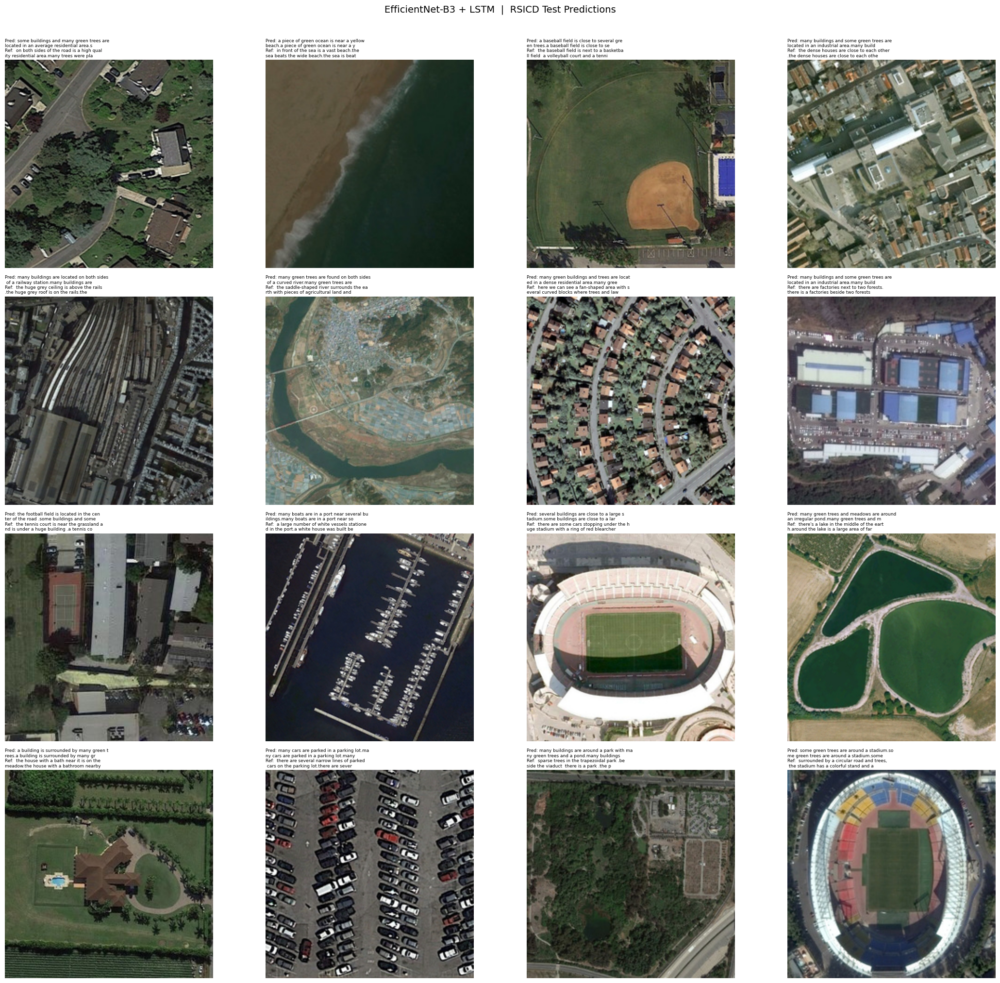

In [16]:
test_unique = df_test.drop_duplicates('filename').head(16)

fig, axes = plt.subplots(4, 4, figsize=(22, 20))
axes = axes.flatten()

for ax, (_, row) in zip(axes, test_unique.iterrows()):
    img = bytes_to_pil(row['image_bytes_str'])
    pred_cap  = predict(img)
    ref_cap   = row['caption']
    ax.imshow(img)
    ax.axis('off')
    # wrap text
    pred_w = '\n'.join([pred_cap[i:i+40] for i in range(0, min(len(pred_cap),80), 40)])
    ref_w  = '\n'.join([ref_cap[i:i+40]  for i in range(0, min(len(ref_cap), 80), 40)])
    ax.set_title(f'Pred: {pred_w}\nRef:  {ref_w}', fontsize=6.5, pad=4, loc='left')

plt.suptitle('EfficientNet-B3 + LSTM  |  RSICD Test Predictions', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig(f'{cfg.SAVE_DIR}/test_predictions.png', dpi=150, bbox_inches='tight')
plt.show()

## Step 13 — Attention Visualisation

Caption: some buildings and many green trees are located in an average residential area.some buildings and many green trees are located


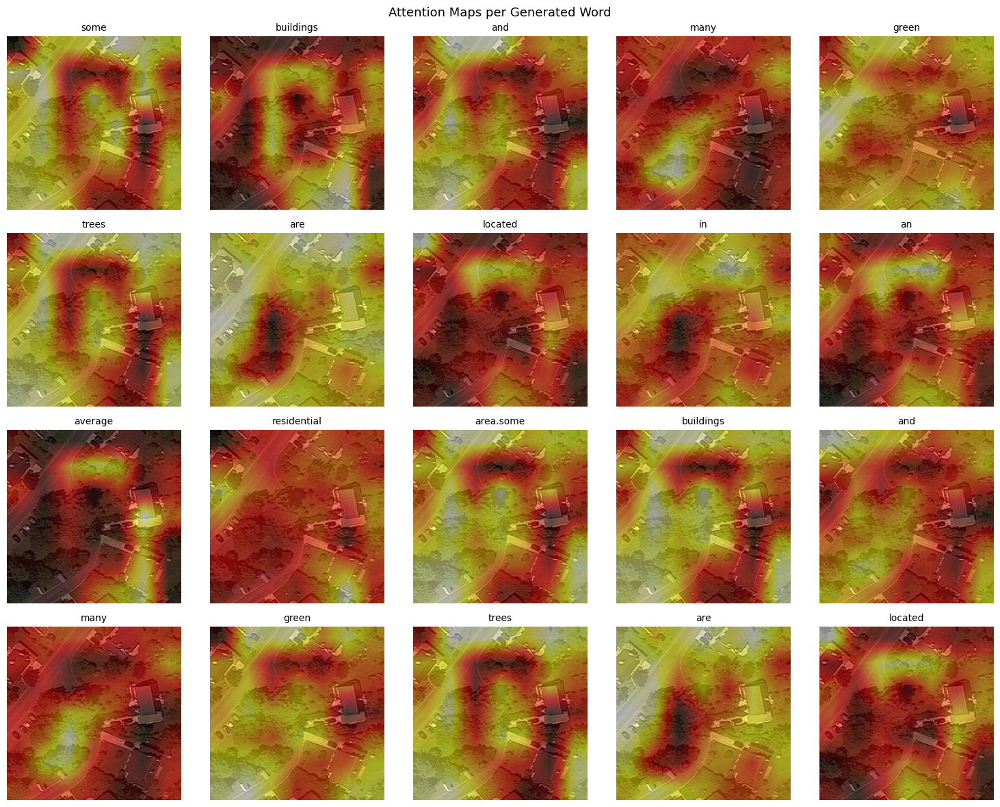

In [17]:
@torch.no_grad()
def get_attention_maps(pil_img, max_words=20):
    model.eval()
    t       = inf_transform(pil_img.convert('RGB')).unsqueeze(0).to(device)
    enc_out = model.encoder(t)
    h, c    = model.decoder.init_hidden(enc_out)
    word    = torch.tensor([vocab.word2idx[cfg.SOS]], device=device)
    words, alphas = [], []
    S = cfg.ENC_SPATIAL
    for _ in range(max_words):
        emb      = model.decoder.embedding(word)
        ctx, alpha = model.decoder.attention(enc_out, h)
        h, c     = model.decoder.lstm_cell(torch.cat([emb, ctx], 1), (h, c))
        word     = model.decoder.fc_out(h).argmax(1)
        wid      = word.item()
        if wid == vocab.word2idx[cfg.EOS]:  break
        words.append(vocab.idx2word[wid])
        alphas.append(alpha.cpu().numpy().reshape(S, S))
    return words, alphas


def plot_attention(pil_img, words, alphas, ncols=5, save_path=None):
    n     = min(len(words), 20)
    nrows = math.ceil(n / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*3, nrows*3))
    axes  = np.array(axes).flatten()
    img_arr = np.array(pil_img.convert('RGB'))
    for i, (w, a) in enumerate(zip(words[:n], alphas[:n])):
        ax = axes[i]
        ax.imshow(img_arr)
        ar = cv2.resize(a, (img_arr.shape[1], img_arr.shape[0]))
        ax.imshow(ar, cmap='hot', alpha=0.5)
        ax.set_title(w, fontsize=10); ax.axis('off')
    for j in range(n, len(axes)):
        axes[j].axis('off')
    plt.suptitle('Attention Maps per Generated Word', fontsize=13)
    plt.tight_layout()
    if save_path:  plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()


sample_img = bytes_to_pil(df_test.iloc[0]['image_bytes_str'])
words, alphas = get_attention_maps(sample_img)
print('Caption:', ' '.join(words))
plot_attention(sample_img, words, alphas,
               save_path=f'{cfg.SAVE_DIR}/attention_map.png')

## Step 14 — BLEU Score Evaluation

In [18]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction, corpus_bleu
import nltk
nltk.download('punkt', quiet=True)

smoother = SmoothingFunction().method1
refs_corpus, hyps_corpus = [], []
per_scores = {1:[], 2:[], 3:[], 4:[]}

for _, row in tqdm(df_test.iterrows(), total=len(df_test), desc='BLEU eval'):
    try:
        img  = bytes_to_pil(row['image_bytes_str'])
        hyp  = predict(img).lower().split()
        ref  = row['caption'].lower().split()
        refs_corpus.append([ref])
        hyps_corpus.append(hyp)
        for n in range(1, 5):
            w = tuple([1./n]*n)
            per_scores[n].append(sentence_bleu([ref], hyp, weights=w,
                                               smoothing_function=smoother))
    except Exception as e:
        print(f'Skip: {e}')

print('\n' + '='*45)
print('  BLEU Scores — RSICD Test Set')
print('='*45)
for n in range(1, 5):
    print(f'  BLEU-{n}: {np.mean(per_scores[n]):.4f}')
print('='*45)

BLEU eval: 100%|██████████| 500/500 [01:32<00:00,  5.39it/s]


  BLEU Scores — RSICD Test Set
  BLEU-1: 0.2040
  BLEU-2: 0.1006
  BLEU-3: 0.0603
  BLEU-4: 0.0404


## Step 15 — Save All Artefacts

In [19]:
artefacts = {
    'config': {
        'encoder_model'  : cfg.ENCODER_MODEL,
        'encoder_dim'    : cfg.ENCODER_DIM,
        'embed_dim'      : cfg.EMBED_DIM,
        'hidden_dim'     : cfg.HIDDEN_DIM,
        'attention_dim'  : cfg.ATTENTION_DIM,
        'max_caption_len': cfg.MAX_CAPTION_LEN,
        'img_size'       : cfg.IMG_SIZE,
        'vocab_size'     : len(vocab),
        'beam_size'      : cfg.BEAM_SIZE,
        'dataset'        : 'RSICD',
    },
    'vocab_word2idx': vocab.word2idx,
}
with open(f'{cfg.SAVE_DIR}/artefacts.json', 'w') as f:
    json.dump(artefacts, f, indent=2)

print('Saved artefacts:')
for fn in sorted(os.listdir(cfg.SAVE_DIR)):
    size_kb = os.path.getsize(f'{cfg.SAVE_DIR}/{fn}') / 1024
    print(f'  {fn:30s}  {size_kb:8.1f} KB')

Saved artefacts:
  artefacts.json                      55.2 KB
  attention_map.png                 4258.9 KB
  best_model.pth                   78918.2 KB
  eda_caption_stats.png               74.4 KB
  eda_sample_images.png             3204.3 KB
  test_predictions.png              8667.8 KB
  vocab.json                          94.6 KB


## Step 16 — Gradio Demo

In [22]:
import gradio as gr
from PIL import Image
import nest_asyncio

nest_asyncio.apply()   # ⭐ FIXES event loop crash

def gradio_predict(image):
    pil = Image.fromarray(image)
    result = predict(pil, beam_size=cfg.BEAM_SIZE)

    if isinstance(result, list):
        result = result[0]

    # return first sentence only
    first_sentence = result.split(".")[0].strip() + "."
    return first_sentence


with gr.Blocks(title='RSICD Caption Generator') as demo:
    gr.Markdown(
        '# Remote Sensing Image Caption Generator\n'
        '**Model:** EfficientNet-B3 + Bahdanau Attention + LSTM'
    )

    with gr.Row():
        img_in  = gr.Image(label='Upload Remote Sensing Image')
        txt_out = gr.Textbox(label='Generated Caption', lines=3)

    btn = gr.Button('Generate Caption')
    btn.click(fn=gradio_predict, inputs=img_in, outputs=txt_out)

demo.launch(share=True, quiet=True)

* Running on public URL: https://9310f1ce72bcb6876b.gradio.live


ERROR:    Exception in ASGI application
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/uvicorn/protocols/http/h11_impl.py", line 403, in run_asgi
    result = await app(  # type: ignore[func-returns-value]
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/uvicorn/middleware/proxy_headers.py", line 60, in __call__
    return await self.app(scope, receive, send)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/fastapi/applications.py", line 1139, in __call__
    await super().__call__(scope, receive, send)
  File "/usr/local/lib/python3.12/dist-packages/starlette/applications.py", line 107, in __call__
    await self.middleware_stack(scope, receive, send)
  File "/usr/local/lib/python3.12/dist-packages/starlette/middleware/errors.py", line 186, in __call__
    raise exc
  File "/usr/local/lib/python3.12/dist-packages/starlette/middleware/errors.py",